## `Social Network Analysis Project`
This project includes visualization of the graph of your friends and their relationships. You will learn some statistics calculated for your friends graph, analyze the structure of your network and detect communities.

In [2]:
import vk_api
import matplotlib.pyplot as plt
import numpy as np
import networkx as nx
from tqdm import tqdm
import pandas as pd
import seaborn as sns
from scipy.spatial.distance import cosine
import itertools
from networkx.algorithms import community
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import squareform
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import KMeans

Firstly, you need to log in to your VK account. Enter your phone and account password in the cell `yourphone` and `yourpassword`

`Comment 1:` If you want to upload more data from the VK, please use this [documentation](https://dev.vk.com/method/friends.get)

`Comment 2:` If this cell does not start and asks to enter a captcha, you need to manually re-log in to your account via the app and try to run this cell again

In [3]:
vk_session = vk_api.VkApi('yourphone', 'yourpassword')
vk_session.auth()
vk = vk_session.get_api()

friends = vk.friends.get(fields = ['name', 'sex'])
my_friends_id_list = friends['items']


Secondly, need to create a graph, where the nodes are your friends and the edges are the relationships between them

`Comment 1:` It is necessary to remove the banned accounts from the friends list, otherwise the algorithm will not work  

In [51]:
G = nx.Graph()

for i in range(friends['count']):
    G.add_node(my_friends_id_list[i]['id'], first_name = my_friends_id_list[i]['first_name'], last_name = my_friends_id_list[i]['last_name'],
    sex = my_friends_id_list[i]['sex'])

for id_friend in tqdm(G.nodes):
    friend_friends_id_list = vk.friends.get(user_id = id_friend)['items']
    for id_friend_friend in list(set(G.nodes).intersection(friend_friends_id_list)):
        G.add_edge(id_friend, id_friend_friend)

100%|██████████| 461/461 [03:25<00:00,  2.24it/s]


Let's draw the resulting graph. If you want to change your network and make it more beautiful, you can change parameters: `node_size`, `node_color` and `width`

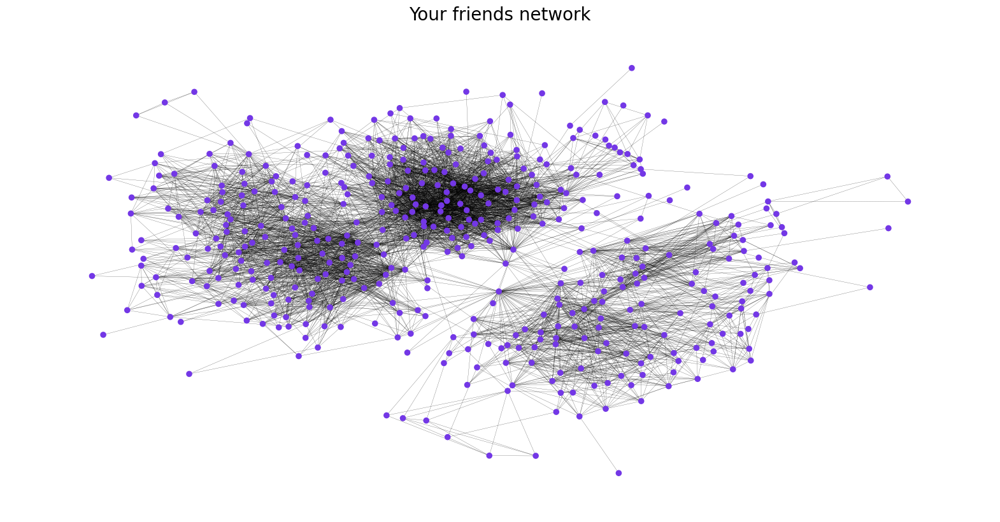

In [68]:
plt.figure(figsize=(20, 10))
layout = nx.kamada_kawai_layout(G)
purple_color = (115/255,55/255,230/255)
nx.draw_networkx_nodes(G, pos=layout, node_size=35, node_color = [purple_color] * len(G.nodes))
nx.draw_networkx_edges(G, pos=layout, width=0.15)
plt.title("Your friends network", fontdict = {'fontsize' : 20})
plt.axis('off')
plt.show()

Now we need to remove nodes, that do not have edges and are not in the main component of connectivity, because these nodes aren't informative and most algorithms don't work with disconnected graphs

In [53]:
largest_cc = max(nx.connected_components(G), key=len)
old_nubmer_nodes = len(G.nodes)
G = G.subgraph(largest_cc)
new_number_nodes = len(G.nodes)
print("Number of deleted nodes:", old_nubmer_nodes - new_number_nodes)

Number of remote nodes: 7


### `Network statistics`

Now you can see your graph's statistics

`Size` - number of edges

`Order` - number of nodes

`Diameter` - largest shortest paths (distance between any two nodes)

`Radius` - smallest eccentricity (greatest distance from one node to any other node)

`Clustering coefficient` - measure of the degree to which nodes in a graph tend to cluster together.  `Average clustring` - average value of clustering coefficient

`Global clustering(transitivity)` - is the overall probability for the network to have adjacent nodes interconnected

`Degree` - number of edges incident (connect) to the node .  `Average degree` - average value of degrees

In [69]:
degree = [i[1] for i in list(G.degree)]
print("My network")
print("Size:", G.size())
print("Order:", G.order())
print("Diameter", nx.diameter(G))
print("Radius:", nx.radius(G))
print("Average clustering:", nx.average_clustering(G))
print("Global clustering:", nx.transitivity(G))
print("Average degree:", np.mean(degree))

My network
Size: 4823
Order: 454
Diameter 7
Radius: 4
Average clustering: 0.5136755354953058
Global clustering: 0.3900277669960887
Average degree: 21.24669603524229


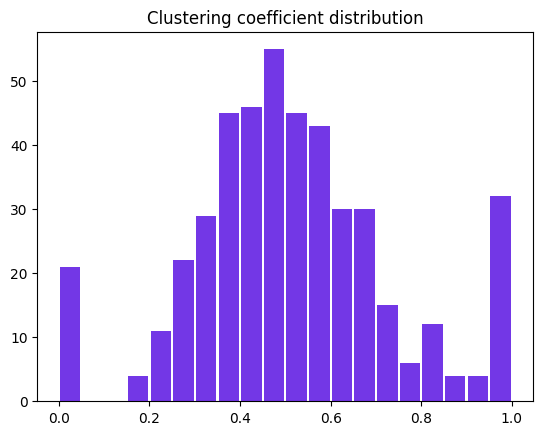

In [70]:
plt.hist(nx.clustering(G).values(), bins=20, rwidth=0.9, color=purple_color)
plt.title("Сlustering coefficient distribution")
plt.show()

`Average shortest path length` - average shortest path length between all nodes.

In [71]:
print("Average shortest path length:", nx.average_shortest_path_length(G))

Average shortest path length: 2.950365162256518


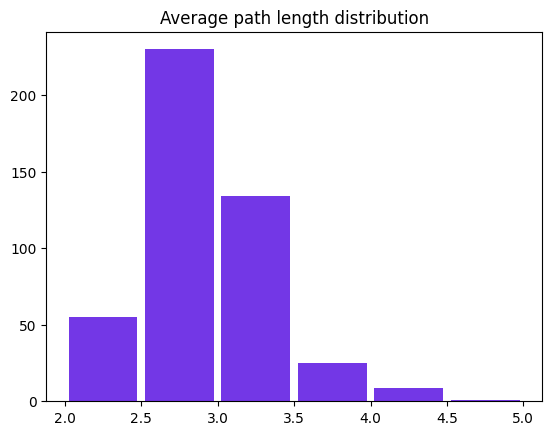

In [72]:
mean_path_list = []
for i in nx.shortest_path_length(G):
    mean_path_list.append(np.mean(list(i[1].values())))

plt.hist(mean_path_list, bins = [2, 2.5, 3, 3.5, 4, 4.5, 5], rwidth=0.9, color=purple_color)
plt.title("Average path length distribution")
plt.show()

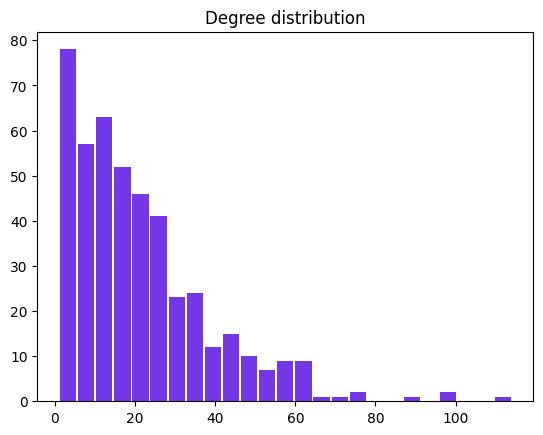

In [73]:
plt.hist(degree, bins = 25, rwidth=0.9, color=purple_color)
plt.title("Degree distribution")
plt.show()

All real social networks obey a [Power law](https://en.wikipedia.org/wiki/Power_law) distribution. In this cell find optimal hyperparameters for estimating our graph distribution and power law.


In [74]:
def power_law_pdf(x, alpha=3.5, x_min=1):
    C = (alpha - 1) / x_min ** (1 - alpha)
    return C * x ** (-alpha)


def power_law_cdf(x, alpha=3.5, x_min=1):
    return 1 - (x / x_min)**(-alpha + 1)


from scipy import stats
def get_alpha(x_min, new_degrees):
    sum = 0.001
    n = len(new_degrees)
    for i in new_degrees:
        sum += np.log(i / x_min)
    return 1 + n / sum


def mle_power_law_params(degree_sequence):
    D_min = 1000000000
    for x in np.sort(degree_sequence):
        x = np.round(x)
        new_degrees = []
        for i in degree_sequence:
            if i >= x:
                new_degrees.append(i) 
        alpha = get_alpha(x, new_degrees)
        if len(new_degrees) != 0:
            D = stats.kstest(new_degrees, power_law_cdf, args=(alpha, x))[0]
            if D_min > D:
                alpha_min = alpha
                x_min = x
                D_min = D
    return alpha_min, x_min 

alpha_min, x_min = mle_power_law_params(degree)
print('alpha_min:', alpha_min)
print('x_min:', x_min)

alpha_min: 3.43866933785112
x_min: 28


If your network obeys power law, you will be able to draw an optimal line in a log-log scale between points.

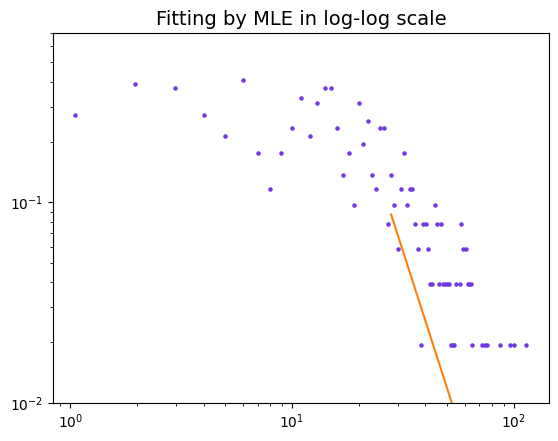

In [75]:
hist, bin_edges = np.histogram(degree, bins=1000, density=True)
bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2
plt.scatter(bin_centers[hist > 0], hist[hist > 0], s=5, color=purple_color)
plt.title('Fitting by MLE in log-log scale',fontdict = {'fontsize' : 14})

x_space = np.linspace(x_min, max(degree), 100)
plt.plot(x_space, power_law_pdf(x_space, alpha_min, x_min), 
         label='Estimated PDF', c='tab:orange')
plt.xscale('log')
plt.yscale('log')
plt.ylim(0.01, 0.7)
plt.show()

### `Structural Analysis`

Let's build some random graph models and try to make their statistics similar to your network. You can read how each of the types of random graphs is built and configured at the following links:

`Random network` - [erdos_renyi_graph](https://networkx.org/documentation/stable/reference/generated/networkx.generators.random_graphs.erdos_renyi_graph.html)

`Preferential attachment` - [barabasi_albert_graph](https://networkx.org/documentation/stable/reference/generated/networkx.generators.random_graphs.barabasi_albert_graph.html)

`Small world` - [watts_strogatz_graph](https://networkx.org/documentation/stable/reference/generated/networkx.generators.random_graphs.connected_watts_strogatz_graph.html#networkx.generators.random_graphs.connected_watts_strogatz_graph)

In [76]:
erdos_renyi_graph = nx.erdos_renyi_graph(454, 0.05)
degree_erg = [i[1] for i in list(erdos_renyi_graph.degree)]
print("Random network")
print("Size:", erdos_renyi_graph.size())
print("Order:", erdos_renyi_graph.order())
print("Diameter", nx.diameter(erdos_renyi_graph))
print("Radius:", nx.radius(erdos_renyi_graph))
print("Average clustering:", nx.average_clustering(erdos_renyi_graph))
print("Average degree:", np.mean(degree_erg))

Random network
Size: 5193
Order: 454
Diameter 3
Radius: 3
Average clustering: 0.048375495703642586
Average degree: 22.876651982378856


In [77]:
barabasi_albert_graph = nx.barabasi_albert_graph(454, 11)
degree_bag = [i[1] for i in list(barabasi_albert_graph.degree)]
print("Preferential attachment")
print("Size:", barabasi_albert_graph.size())
print("Order:", barabasi_albert_graph.order())
print("Diameter", nx.diameter(barabasi_albert_graph))
print("Radius:", nx.radius(barabasi_albert_graph))
print("Average clustering:", nx.average_clustering(barabasi_albert_graph))
print("Average degree:", np.mean(degree_bag))

Preferential attachment
Size: 4873
Order: 454
Diameter 4
Radius: 2
Average clustering: 0.11054986909759083
Average degree: 21.46696035242291


In [78]:
small_world_graph = nx.connected_watts_strogatz_graph(n=454, k=22, p=0.1)
degree_swg = [i[1] for i in list(small_world_graph.degree)]
print("Small world")
print("Size:", small_world_graph.size())
print("Order:", small_world_graph.order())
print("Diameter", nx.diameter(small_world_graph))
print("Radius:", nx.radius(small_world_graph))
print("Average clustering:", nx.average_clustering(small_world_graph))
print("Average degree:", np.mean(degree_swg))

Small world
Size: 4994
Order: 454
Diameter 4
Radius: 3
Average clustering: 0.5264454343169351
Average degree: 22.0


Now let's move on to finding the central nodes in your network. There are several types of centrality. 

In this cell we set the number of top nodes you want to see.

In [79]:
N_top = 5

`Degree centrality:` Cental node are node with a highest degree (number of edges of the node). More detail [here](https://en.wikipedia.org/wiki/Centrality#Degree_centrality)

In [80]:
degree_centrality = np.array(list(nx.degree_centrality(G).values()))

top_degree_centrality = []
for i in sorted(nx.degree_centrality(G).items(), key=lambda x: -x[1])[0:N_top]:
    top_degree_centrality.append(i[0])

labels = {}
count = 0
for i in top_degree_centrality:
    count += 1
    labels[i] = count
    print(count, G.nodes[i]['first_name'] + ' ' + G.nodes[i]['last_name'])

1 Sergey Parshikov
2 Ivan Zakharov
3 Nikita Potebnya
4 Anya Egorova
5 Ekaterina Yasko


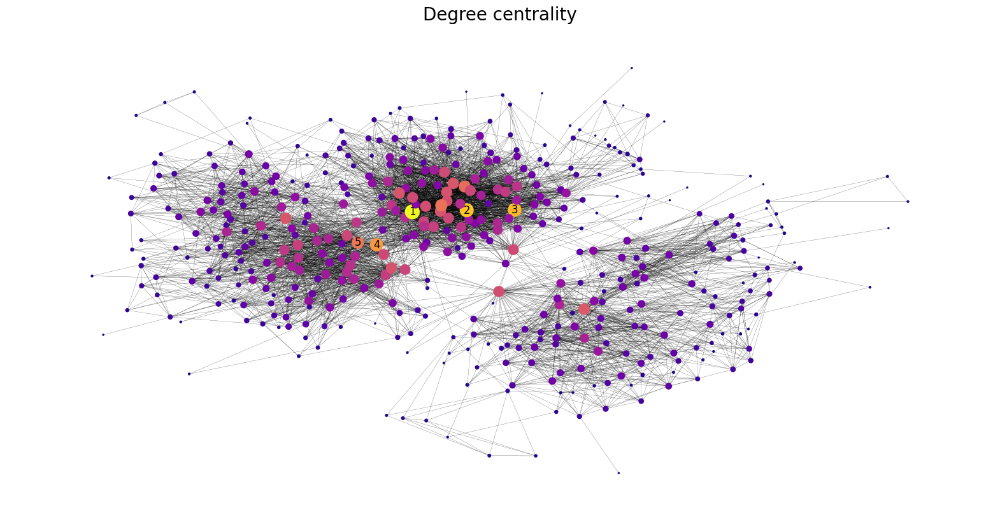

In [81]:
plt.figure(figsize=(20, 10))
plt.set_cmap('plasma')
nx.draw_networkx_nodes(G, pos=layout, node_size=degree_centrality * 1000, node_color=degree_centrality)
nx.draw_networkx_edges(G, pos=layout, width=0.15)
nx.draw_networkx_labels(G, pos=layout, labels=labels, font_size = 12, font_color='black')
plt.title("Degree centrality", fontdict = {'fontsize' : 20})
plt.axis('off')
plt.show()

`Closeness centrality:` Central node are node with the shortest path length to all other nodes. More detail [here](https://en.wikipedia.org/wiki/Centrality#Closeness_centrality)

In [82]:
closeness_centrality = np.array(list(nx.closeness_centrality(G).values()))

top_closeness_centrality = []
for i in sorted(nx.closeness_centrality(G).items(), key=lambda x: -x[1])[0:N_top]:
    top_closeness_centrality.append(i[0])

labels = {}
count = 0
for i in top_closeness_centrality:
    count += 1
    labels[i] = count
    print(count, G.nodes[i]['first_name'] + ' ' + G.nodes[i]['last_name'])

1 Nikita Potebnya
2 Ivan Zakharov
3 Ekaterina Yasko
4 Max Dukhin
5 Mikich Esayan


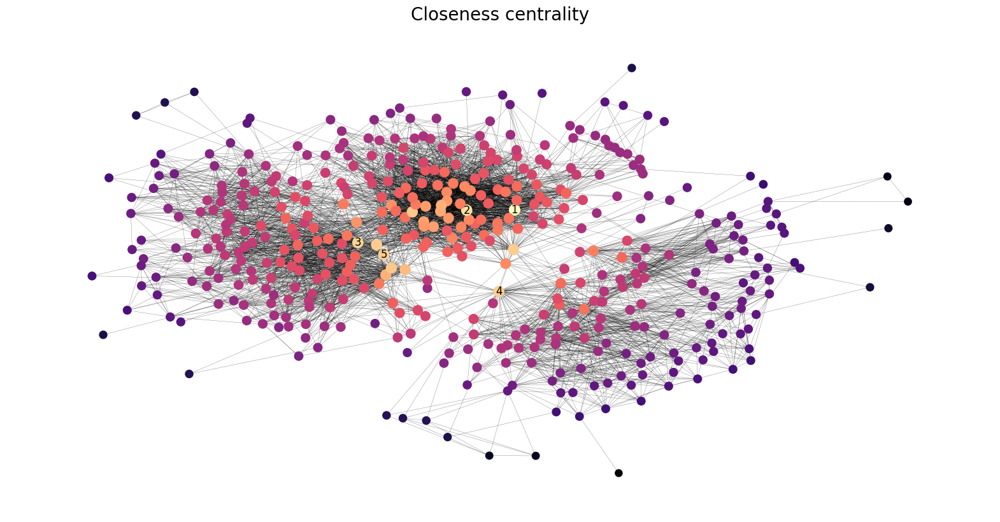

In [83]:
plt.figure(figsize=(20, 10))
plt.set_cmap('magma')
nx.draw_networkx_nodes(G, pos=layout, node_size=closeness_centrality * 300, node_color=closeness_centrality)
nx.draw_networkx_edges(G, pos=layout, width=0.15)
nx.draw_networkx_labels(G, pos=layout, labels=labels, font_size = 12, font_color='black')
plt.title("Closeness centrality", fontdict = {'fontsize' : 20})
plt.axis('off')
plt.show()


`Betweenness centrality:` Central node are node that most often occurs as a bridge in the path between two nodes. More detail [here](https://en.wikipedia.org/wiki/Centrality#Betweenness_centrality)

In [84]:
betweenness_centrality = np.array(list(nx.betweenness_centrality(G).values()))

top_betweenness_centrality = []
for i in sorted(nx.betweenness_centrality(G).items(), key=lambda x: -x[1])[0:N_top]:
    top_betweenness_centrality.append(i[0])

labels = {}
count = 0
for i in top_betweenness_centrality:
    count += 1
    labels[i] = count
    print(count, G.nodes[i]['first_name'] + ' ' + G.nodes[i]['last_name'])

1 Max Dukhin
2 Nikita Potebnya
3 Max Nikulin
4 Katya Kusakina
5 Ekaterina Yasko


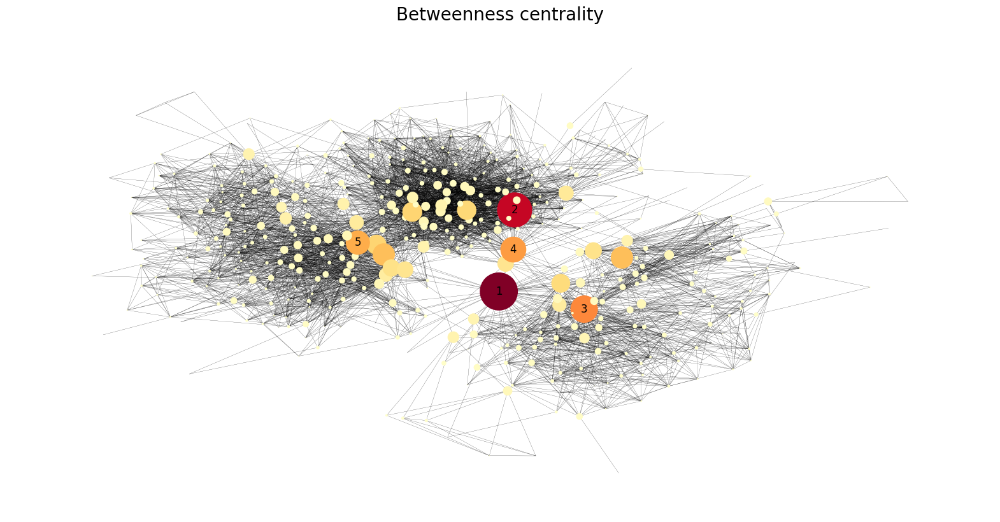

In [85]:
plt.figure(figsize=(20, 10))
plt.set_cmap('YlOrRd')
nx.draw_networkx_nodes(G, pos=layout, node_size=betweenness_centrality * 10000, node_color=betweenness_centrality)
nx.draw_networkx_edges(G, pos=layout, width=0.15)
nx.draw_networkx_labels(G, pos=layout, labels=labels, font_size = 12, font_color='black')
plt.title("Betweenness centrality", fontdict = {'fontsize' : 20})
plt.axis('off')
plt.show()

`Pagerank:` variety degree centrality. This algorithm is used in Google to rank web pages after a query. More detail [here](https://en.wikipedia.org/wiki/Centrality#PageRank_centrality)

In [86]:
pagerank = np.array(list(nx.pagerank(G).values()))

top_pagerank = []
for i in sorted(nx.pagerank(G).items(), key=lambda x: -x[1])[0:N_top]:
    top_pagerank.append(i[0])

labels = {}
count = 0
for i in top_pagerank:
    count += 1
    labels[i] = count
    print(count, G.nodes[i]['first_name'] + ' ' + G.nodes[i]['last_name'])

1 Max Nikulin
2 Nikita Potebnya
3 Sergey Parshikov
4 Ivan Zakharov
5 Max Dukhin


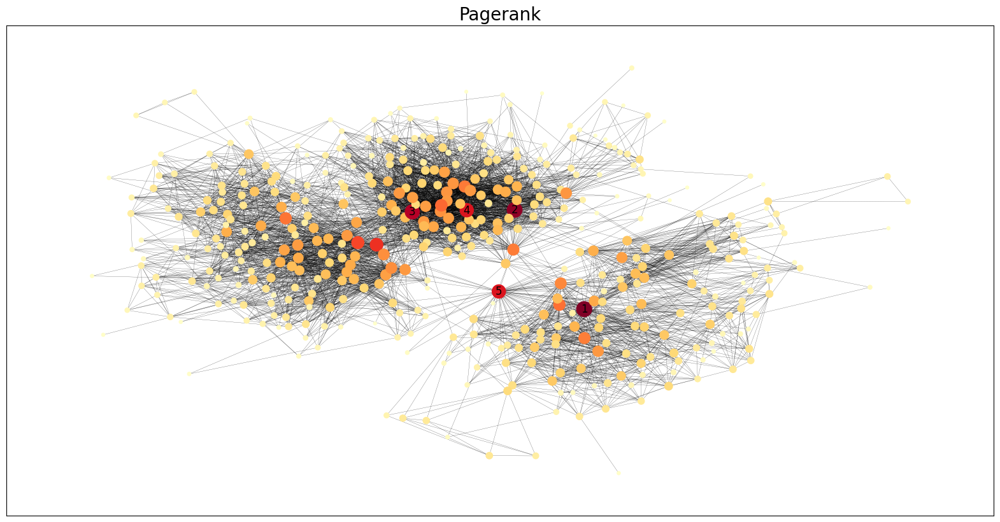

In [87]:
plt.figure(figsize=(20, 10))
plt.set_cmap('YlOrRd')
nx.draw_networkx_nodes(G, pos=layout, node_size=pagerank * 30000, node_color=pagerank)
nx.draw_networkx_edges(G, pos=layout, width=0.15)
nx.draw_networkx_labels(G, pos=layout, labels=labels, font_size = 12, font_color='black')
plt.title("Pagerank", fontdict = {'fontsize' : 20})
plt.show()

You can output the most common nodes

In [88]:
all_top_list = []
all_top_list.append(top_degree_centrality)
all_top_list.append(top_closeness_centrality)
all_top_list.append(top_betweenness_centrality)
all_top_list.append(top_pagerank)
unique, counts = np.unique(all_top_list, return_counts=True)
count = 0
for i in sorted(np.asarray((unique, counts)).T, key=lambda x: -x[1])[0:N_top]:
        count += 1
        print(count, G.nodes[i[0]]['first_name'] + ' ' + G.nodes[i[0]]['last_name'])


1 Nikita Potebnya
2 Ivan Zakharov
3 Max Dukhin
4 Ekaterina Yasko
5 Sergey Parshikov


And look at the matrix and illustration of correlations of centralities

In [90]:
correlation_matrix = []
correlation_matrix.append(degree_centrality)
correlation_matrix.append(closeness_centrality) 
correlation_matrix.append(betweenness_centrality)
correlation_matrix.append(pagerank)
correlation_matrix = np.round(np.corrcoef(correlation_matrix), 5)
df = pd.DataFrame({'centralities': ['degree', 'closeness', 'betweenness', 'pagerank'],
    'degree': correlation_matrix[0], 'closeness': correlation_matrix[1], 'betweenness': correlation_matrix[2], 'pagerank': correlation_matrix[3]})
df

,centralities,degree,closeness,betweenness,pagerank
0,degree,1.00000,0.80760,0.52466,0.93813
1,closeness,0.80760,1.00000,0.44871,0.70499
2,betweenness,0.52466,0.44871,1.00000,0.65795
3,pagerank,0.93813,0.70499,0.65795,1.00000


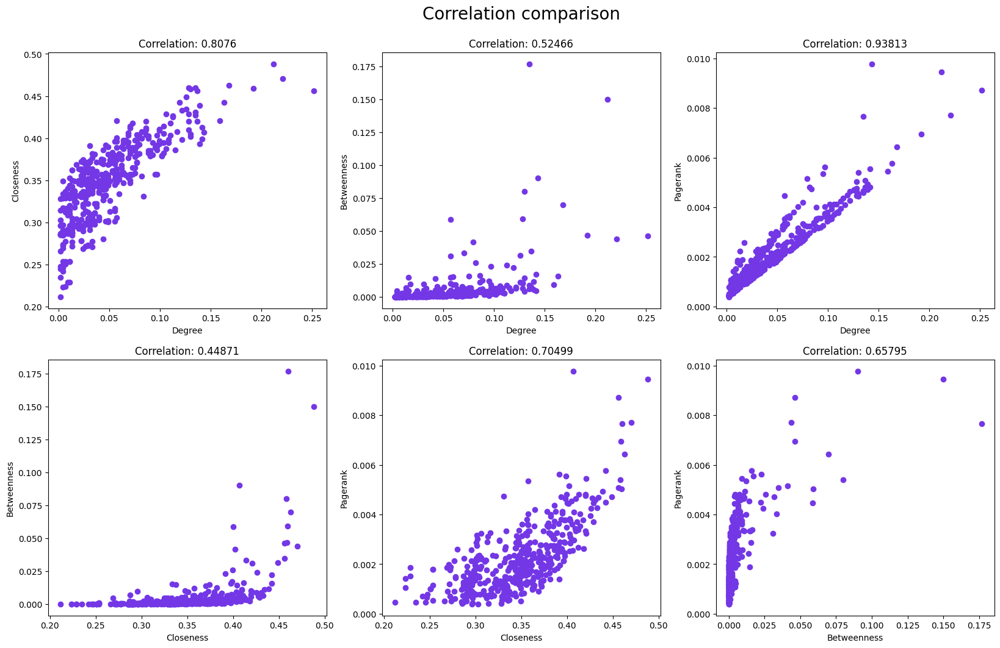

In [91]:
fig = plt.figure(figsize = (20, 12))
plt.title('Correlation comparison', y=1.05, fontdict = {'fontsize' : 20})
plt.axis('off')

ax1 = fig.add_subplot(231)
ax1.scatter(degree_centrality, closeness_centrality, color=purple_color)
ax1.set_title('Correlation: '+ str(float(df.loc[df['centralities'] == 'degree', 'closeness'])))
ax1.set_xlabel('Degree')
ax1.set_ylabel('Closeness')

ax2 = fig.add_subplot(232)
ax2.scatter(degree_centrality, betweenness_centrality, color=purple_color)
ax2.set_title('Correlation: '+ str(float(df.loc[df['centralities'] == 'degree', 'betweenness'])))
ax2.set_xlabel('Degree')
ax2.set_ylabel('Betweenness')

ax3 = fig.add_subplot(233)
ax3.scatter(degree_centrality, pagerank, color=purple_color)
ax3.set_title('Correlation: '+ str(float(df.loc[df['centralities'] == 'degree', 'pagerank'])))
ax3.set_xlabel('Degree')
ax3.set_ylabel('Pagerank')

ax4 = fig.add_subplot(234)
ax4.scatter(closeness_centrality, betweenness_centrality, color=purple_color)
ax4.set_title('Correlation: '+ str(float(df.loc[df['centralities'] == 'closeness', 'betweenness'])))
ax4.set_xlabel('Closeness')
ax4.set_ylabel('Betweenness')

ax5 = fig.add_subplot(235)
ax5.scatter(closeness_centrality, pagerank, color=purple_color)
ax5.set_title('Correlation: '+ str(float(df.loc[df['centralities'] == 'closeness', 'pagerank'])))
ax5.set_xlabel('Closeness')
ax5.set_ylabel('Pagerank')

ax6 = fig.add_subplot(236)
ax6.scatter(betweenness_centrality, pagerank, color=purple_color)
ax6.set_title('Correlation: '+ str(float(df.loc[df['centralities'] == 'betweenness', 'pagerank'])))
ax6.set_xlabel('Betweenness')
ax6.set_ylabel('Pagerank')
plt.show()

let's look at the correlation between the gender of your friends

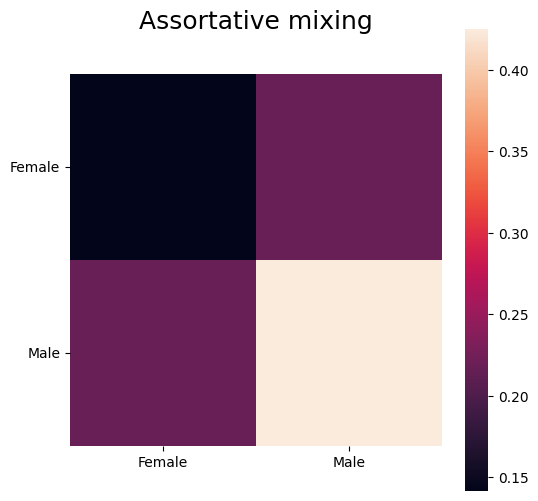

In [92]:
sex_values = np.random.permutation(
    np.unique([G.nodes[n]['sex'] for n in G.nodes])
)
mapping = {val: i for i, val in enumerate(sex_values)}
sex_mixing_matrix = nx.attribute_mixing_matrix(G, 'sex', mapping=mapping)

fig = plt.figure(figsize=(6, 6))
hmap = sns.heatmap(
    sex_mixing_matrix,
    cbar=True,
    square=True)

sex_to_string = []
for m in mapping:
    if m == 1:
        sex_to_string.append('Female')
    else:
        sex_to_string.append('Male')
hmap.set_xticklabels(sex_to_string)
hmap.set_yticklabels(sex_to_string, rotation=0)
plt.title('Assortative mixing', y = 1.1, fontdict = {'fontsize' : 18})
plt.show()

And let's try to find nodes that are similar in statistics

In [93]:
def sim_values(A, i, j):
    pval = np.corrcoef(A[i], A[j])
    cval = 1 - cosine(A[i], A[j])
    return pval[0][1], cval

A = nx.to_numpy_array(G)
cos_sim = np.zeros(A.shape)
pearson_sim = np.zeros(A.shape)
for i in range(len(G)):
    for j in range(i, (len(G))):
        pval, cval = sim_values(A, i, j)
        pearson_sim[i, j] = pval
        pearson_sim[j, i] = pval
        cos_sim[i, j] = cval
        cos_sim[j, i] = cval

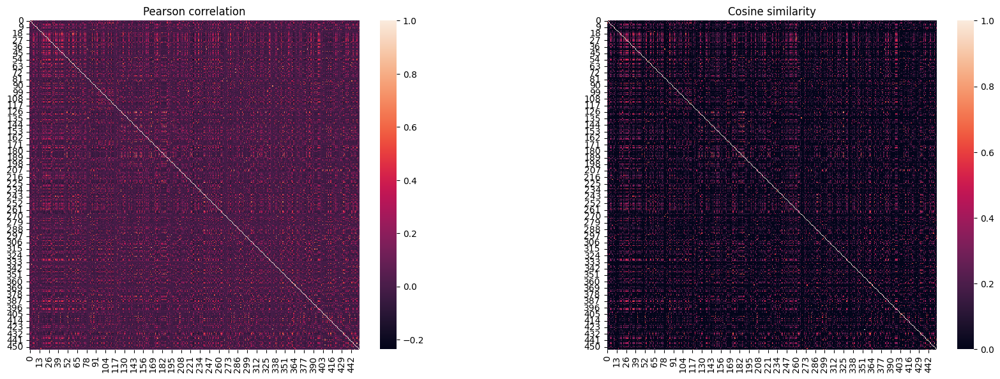

In [94]:
fig = plt.figure(figsize=(20, 10))
plt.subplots_adjust(hspace=0.4, wspace=0.4)
cases = [[1, pearson_sim, None, 'Pearson correlation'], 
         [2, cos_sim, None, 'Cosine similarity'], ]
for i, matrix, cmap, t in cases:
    plt.subplot(1, 2, i)
    hmap = sns.heatmap(
        matrix,
        cmap=cmap,
        cbar_kws={"shrink": 0.67},
        square=True)
    plt.title(t)

### `Community detection`

Now let's look for communities in your network.

`Clique` -  subset of vertices of an  graph such that every two distinct nodes in the clique are adjacent.

In [33]:
cliques = list(nx.find_cliques(G))
top_cliques = sorted(cliques, key=len, reverse=True)[0:4]

def draw_cliques(clique):
    node_color = []
    orange_color = (1, 165/255, 0)
    for nodes in G.nodes:
        if nodes in clique:
            node_color.append(orange_color)
        else:
            node_color.append(purple_color)

    line_width = []
    probability_edges = list(itertools.permutations(clique, 2))
    for edges in G.edges:
        if edges in probability_edges:
            line_width.append(0.7)
        else:
            line_width.append(0.1)
    return node_color, line_width

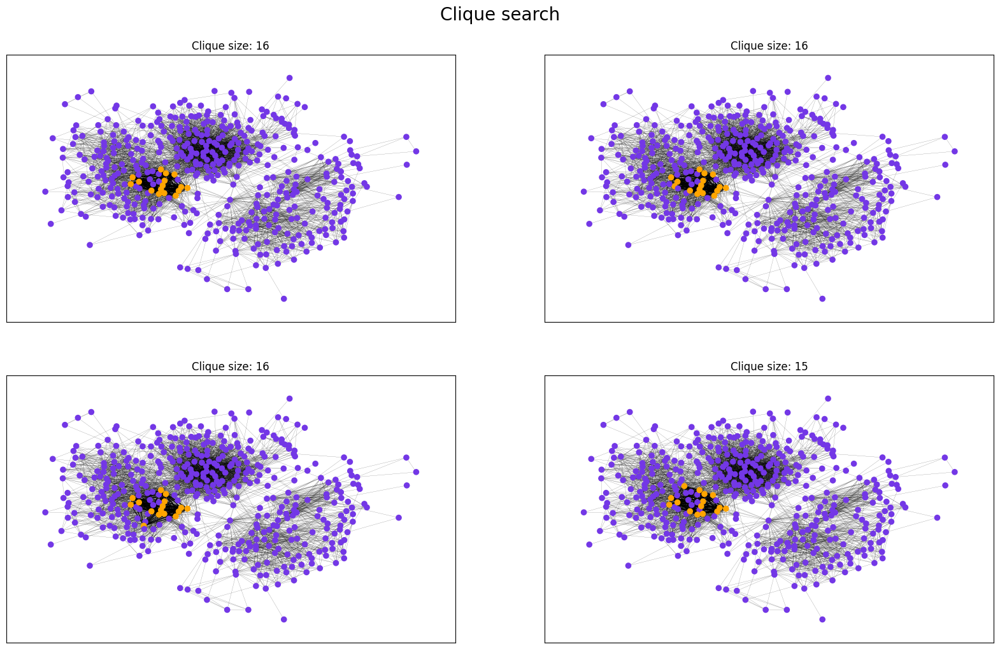

In [34]:
fig = plt.figure(figsize = (20, 12))
plt.title('Clique search', y=1.05, fontdict = {'fontsize' : 20})
plt.axis('off')
for i in range(1, len(top_cliques) + 1):
    ax1 = fig.add_subplot(2, 2, i)
    clique = top_cliques[i - 1]
    node_color, line_width = draw_cliques(clique)
    nx.draw_networkx_nodes(G, pos=layout, node_size=35, node_color = node_color)
    nx.draw_networkx_edges(G, pos=layout, width=line_width)
    ax1.set_title('Clique size: '+ str(len(clique)))
plt.show()

`K-core decomposition` - recursive removal of nodes with degree less than k.

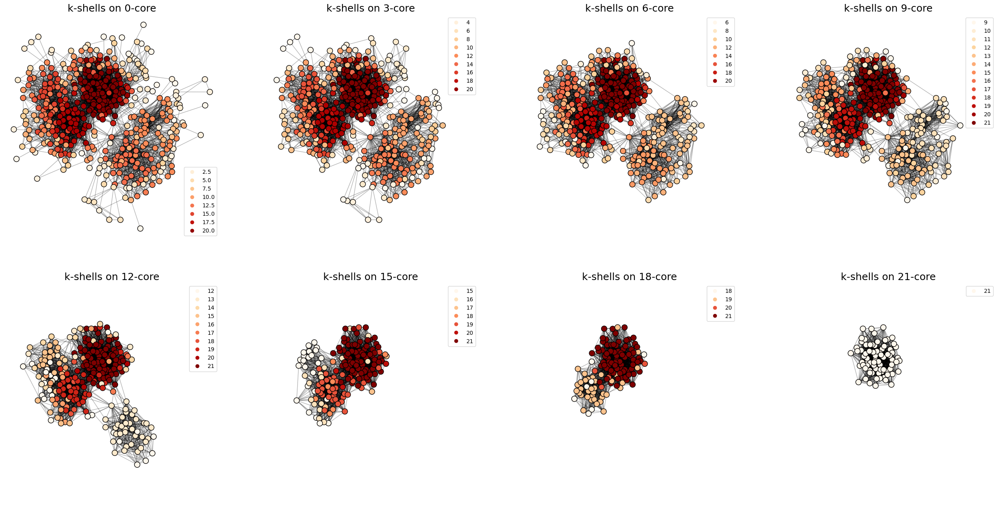

In [109]:
def k_core_decompose(G):
    return np.array(list(nx.core_number(G).values()))

plt.figure(figsize=(32, 16))

x_max, y_max = np.array(list(layout.values())).max(axis=0)
x_min, y_min = np.array(list(layout.values())).min(axis=0)

for i in range(8):
    plt.subplot(2, 4, i+1)
    subG = nx.k_core(G, i*3)
    nodes = nx.draw_networkx_nodes(
        subG, 
        layout,
        cmap=plt.cm.OrRd,
        node_color=k_core_decompose(subG), 
        node_size=100, 
        edgecolors='black'
    )
    nx.draw_networkx_edges(
        subG, 
        layout,
        alpha=0.3,
        width=1, 
        edge_color='black'
    )
    eps = (x_max - x_min) * 0.05
    plt.xlim(x_min-eps, x_max+eps)
    plt.ylim(y_min-eps, y_max+eps)
    plt.legend(*nodes.legend_elements())
    plt.axis('off')
    plt.title('k-shells on {}-core'.format(i*3), fontdict = {'fontsize' : 18})

`Girvan-Newman algorithm` - use on the iterative elimination of edges that have the highest number of shortest paths between nodes passing through them. More detail about algorithm you can see [here](https://networkx.guide/algorithms/community-detection/girvan-newman/)

For the beginning, you have to determine the number of communities

This can be done using the graph below, you need to find the value of the number of communities at which the maximum modularity is achieved

In [36]:
k_community = []
modularity = []
new_girvan_community = community.girvan_newman(G)
count = 0
for communities in itertools.islice(new_girvan_community, 22):
    k_community.append(list(sorted(c) for c in communities))
    modularity.append(community.modularity(G, k_community[count]))
    count += 1


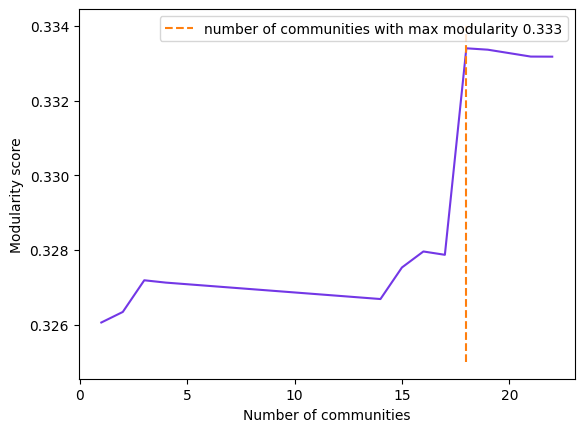

In [37]:
x = np.arange(1, 23, 1)
plt.plot(x, modularity, color=purple_color)
plt.plot([18, 18], [0.325, 0.334], linestyle='--', c='tab:orange', label = 'number of communities with max modularity 0.333')
plt.xlabel('Number of communities')
plt.ylabel('Modularity score')
plt.legend()
plt.show()

Let's set the required number of communities and build the resulting graph

In [95]:
N_communities = 18

In [96]:
best_community = k_community[N_communities]
node_color_community = []
for i in range(len(best_community)):
    for j in range(len(best_community[i])):
        node_color_community.append([best_community[i][j], i])
node_color_community = sorted(node_color_community, key = lambda x: x[0])
for i in node_color_community:
    i.pop(0)

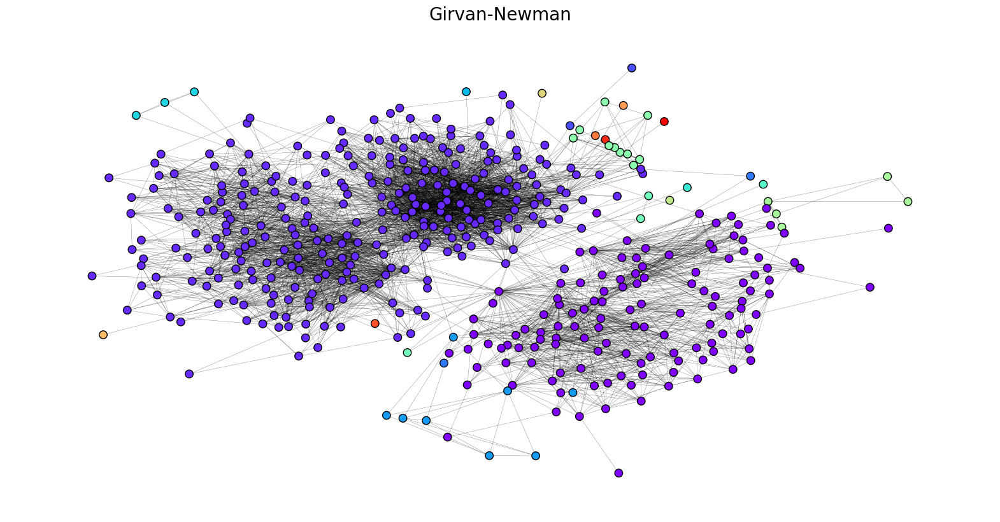

In [97]:
plt.figure(figsize=(20, 10))
nx.draw_networkx_nodes(G, pos=layout, node_size=80, cmap = plt.cm.rainbow, node_color=node_color_community, linewidths=1, edgecolors='black')
nx.draw_networkx_edges(G, pos=layout, width=0.15)
plt.title("Girvan-Newman", fontdict = {'fontsize' : 20})
plt.axis('off')
plt.show()

`Agglomerative clustering algorithm` - recursively merges pair of clusters of sample data, uses linkage distance.

In [40]:
def simrank_distance(G):
    sim = nx.simrank_similarity(G)
    simrank_matrix = np.array([[sim[u][v] for v in G] for u in G])
    simrank_matrix = np.around(simrank_matrix, 8)
    distance = np.full(len(simrank_matrix), 1) - simrank_matrix 
    return distance

distance = simrank_distance(G)
def agglomerative_clustering(distance, max_distance):
    clustering = AgglomerativeClustering(n_clusters = None, distance_threshold = max_distance, linkage = 'complete', compute_full_tree=True,
    affinity='precomputed').fit(distance)
    return clustering.labels_
    

To determine the acceptable maximum distance, you need to build a dendrogram and choose the optimal number of clusters (by eye)

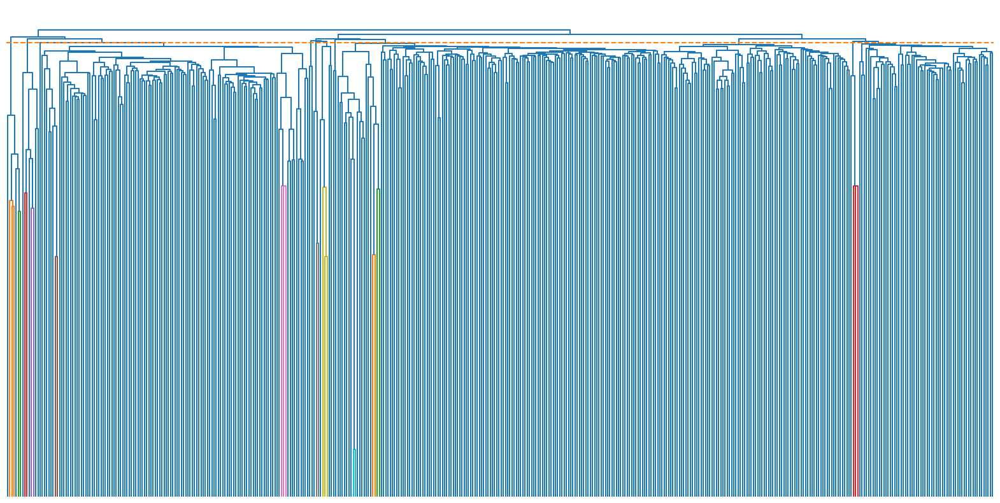

In [100]:
plt.figure(figsize=(20, 10))
linked = linkage(squareform(distance), 'complete')
dendrogram(linked, labels=list(G.nodes), leaf_font_size=12)
plt.plot([0, 5000], [0.97, 0.97], linestyle='--', c='tab:orange')
plt.axis('off')
plt.show()

Let's set the acceptable maximum distance and build the resulting graph

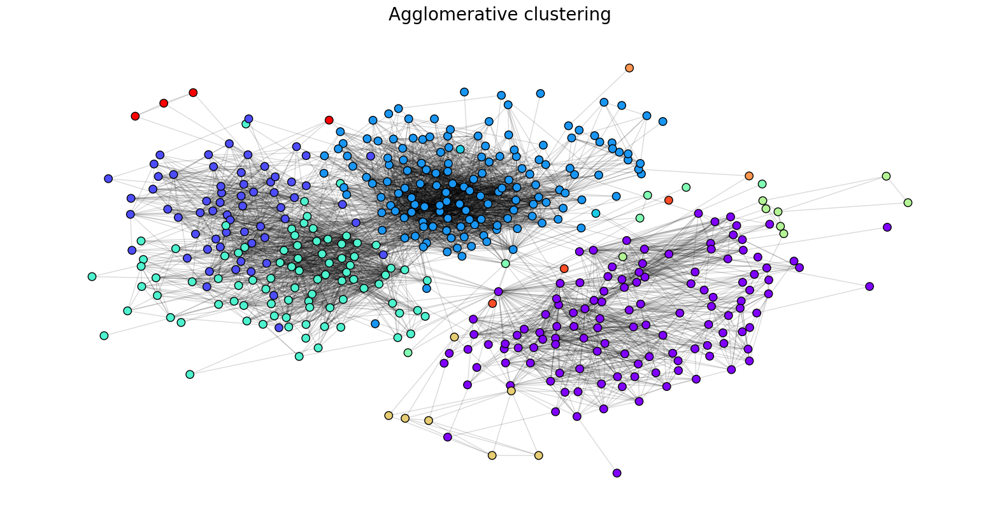

In [42]:
labels = agglomerative_clustering(distance, 0.97)
plt.figure(figsize=(20, 10))
nx.draw_networkx_nodes(
    G, 
    layout,
    cmap=plt.cm.rainbow,
    node_color=labels, 
    node_size=80, 
    linewidths=1, 
    edgecolors='black'
)
nx.draw_networkx_edges(G,layout,alpha=0.15,edge_color='black')
plt.title('Agglomerative clustering', fontdict = {'fontsize' : 20})
plt.axis('off')
plt.show()

`Laplacian eigenmaps` - algorithm based on calculating the eigenvectors of the Laplacian and applying the k-means algorithm to these vectors

In [43]:
def norm_laplacian(A):
    D = np.diag(A.sum(axis=0))
    inverse_D = np.linalg.inv(np.sqrt(D))
    L = inverse_D @ (D - A) @ inverse_D
    return L

A = nx.to_numpy_array(G)
L = norm_laplacian(A)

def spectral_embedding(L, n_components):
    vals, vecs = np.linalg.eigh(L)

    index_vecs = list(zip(range(len(vecs)), vals))
    sort_vecs = sorted(index_vecs, key=lambda x: x[1])
    sort_vecs = sort_vecs[1:n_components + 1]
    result = []
    for i in sort_vecs:
        result.append(vecs[:, i[0]])
    return np.array(result).T

def spectral_clustering(G, n_clusters, n_components):
    A = nx.to_numpy_array(G)
    L = norm_laplacian(A)
    embedding = spectral_embedding(L, n_components)
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(embedding)
    return kmeans.labels_

labels = spectral_clustering(G, 5, 3)


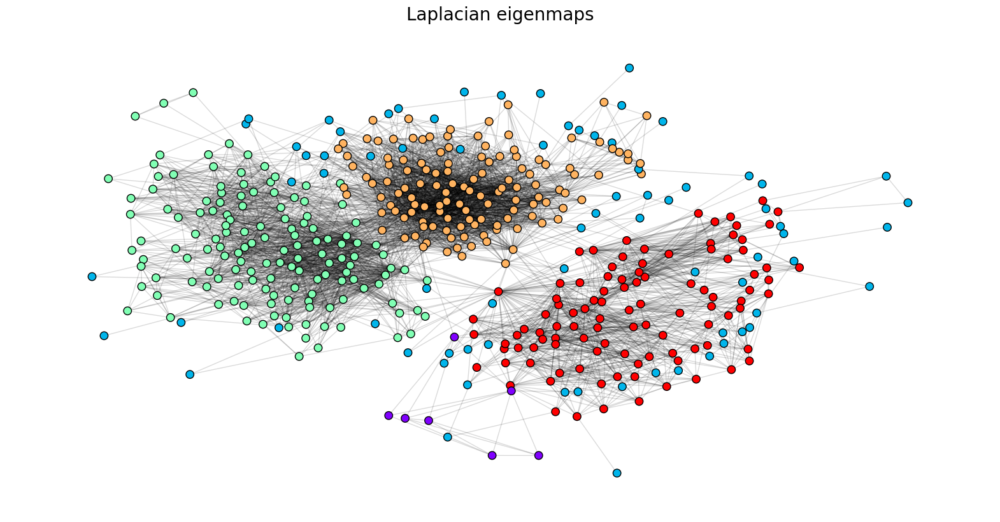

In [44]:
plt.figure(figsize=(20, 10))
nx.draw_networkx_nodes(
    G,
    pos=layout, 
    cmap=plt.cm.rainbow,
    node_color=labels, 
    edgecolors='black', 
    node_size=80)
nx.draw_networkx_edges(G,layout,alpha=0.15,edge_color='black')
plt.title('Laplacian eigenmaps', fontdict = {'fontsize' : 20})
plt.axis('off')
plt.show()

Finally, if you want to evaluate which of the algorithms best identified the communities in your graph, you can use the information about the person's first and last name

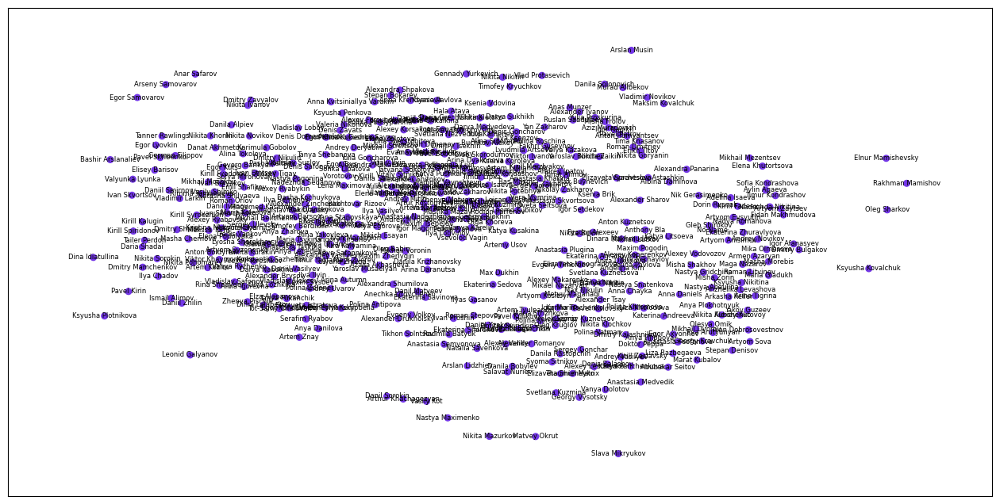

In [104]:
labels = {}
for i in G.nodes:
    labels[i] = G.nodes[i]['first_name'] + ' ' + G.nodes[i]['last_name']  
plt.figure(figsize=(16, 8))
layout = nx.kamada_kawai_layout(G)
nx.draw_networkx_nodes(G, pos=layout, node_size=30, node_color = [purple_color] * len(G.nodes))
nx.draw_networkx_edges(G, pos=layout, width=0)
nx.draw_networkx_labels(G, pos=layout, labels=labels, font_size = 6)
plt.show()